# Getting the data

https://scikit-learn.org/stable/modules/model_evaluation.html

In [ ]:
!git clone https://github.com/YasaminAbbaszadegan/NLP_Forum_Recomendation_Engine.git

Cloning into 'NLP_Forum_Recomendation_Engine'...
remote: Enumerating objects: 61, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 61 (delta 29), reused 43 (delta 11), pack-reused 0
Unpacking objects: 100% (61/61), done.


In [ ]:
%cd /content/NLP_Forum_Recomendation_Engine/Dataset

/content/NLP_Forum_Recomendation_Engine/Dataset


In [ ]:
ls

tudiabetes_20.csv


In [ ]:
import logging
import pandas as pd
import numpy as np
from numpy import random
import gensim
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import re
from bs4 import BeautifulSoup
from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:

df=pd.read_csv('tudiabetes_20.csv',index_col=0) #MyDF_final_main_comment.csv

In [ ]:
#df=df.drop(['tags'],axis=1)
df

,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies
0,About the Social Clubs category,Social Clubs,[],Social Clubs are places for people with simila...,[],"Jul 26, 2018 9:24 pm",0,722,2
1,Latest Movie You’ve Seen?,Social Clubs,['Movies and Entertainment Media'],"Hi Everyone,\nWhat is the latest movie that yo...",['My wife and I see about one movie a week. L...,"Mar 12, 2019 12:45 am",0,578,5
2,Anyone doing the Broad St. Run in philly,Social Clubs,['Running'],got my notification yesterday. time to get bac...,[],0,0,0,0
3,Embroidery…. just starting out,Social Clubs,['Carefully Crafted'],Love love love creating!\nAfter years of not s...,"['That’s beautiful!', 'Thanks, so loving a dar...","Feb 4, 2019 11:31 am",4,505,2
4,Home theatre,Social Clubs,['Movies and Entertainment Media'],If anyone is approaching retirement and wonder...,[],0,0,0,0
...,...,...,...,...,...,...,...,...,...
3694,Frequent Occlusions with Tandem X2,Diabetes Technology,[],A few months ago my son switched from a Medtro...,"['What infusion sets are he using?', 'The Tand...","Dec 11, 2019 3:52 pm",7,700,15
3695,Any loopers using this button?,Diabetes Technology,['DIY Closed Loop Systems'],Anybody using this button (right of the meal b...,"['I use this button many times, every day. It’...","Dec 7, 2019 11:46 am",0,645,24
3696,Which infusion set?,Diabetes Technology,['Insulin Pumps'],I have Tandem T2 pump. Started using the steel...,['I use the Autosoft 30. A spring sends it in...,"Dec 12, 2018 6:10 pm",7,1.8k,17
3697,Availability of diabetes products in Canada. I...,Diabetes Technology,[],So I love new advancements in D-technology. Bu...,['Yes - frustrated.\nI would like to try Tresi...,"Oct 6, 2016 9:14 pm",16,7.0k,33


# Remove '[ ]' in Tags and Post Replies

In [ ]:
df['Tags'] = df['Tags'].str.replace("[", "")
df['Tags'] = df['Tags'].str.replace("]", "")
df['Tags'] = df['Tags'].str.replace("'", "")
df['Post Replies'] = df['Post Replies'].str.replace("[", "")
df['Post Replies'] = df['Post Replies'].str.replace("]", "")
df['Post Replies'] = df['Post Replies'].str.replace("'", "")


In [ ]:
df.head()

,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies
0,About the Social Clubs category,Social Clubs,,Social Clubs are places for people with simila...,,"Jul 26, 2018 9:24 pm",0,722,2
1,Latest Movie You’ve Seen?,Social Clubs,Movies and Entertainment Media,"Hi Everyone,\nWhat is the latest movie that yo...",My wife and I see about one movie a week. Las...,"Mar 12, 2019 12:45 am",0,578,5
2,Anyone doing the Broad St. Run in philly,Social Clubs,Running,got my notification yesterday. time to get bac...,,0,0,0,0
3,Embroidery…. just starting out,Social Clubs,Carefully Crafted,Love love love creating!\nAfter years of not s...,"That’s beautiful!, Thanks, so loving a dark ba...","Feb 4, 2019 11:31 am",4,505,2
4,Home theatre,Social Clubs,Movies and Entertainment Media,If anyone is approaching retirement and wonder...,,0,0,0,0


In [ ]:
df['Category'].unique()

array(['Social Clubs', 'TuDiabetes Website', 'Welcome', 'Type 1 and LADA',
       'Type 2', 'Diabetes and Pregnancy', 'Community', 'Food',
       'Treatment', 'Diabetes Technology'], dtype=object)

In [ ]:
df['Category'].nunique()

10

# Data Visualization

Its a little imbalanced

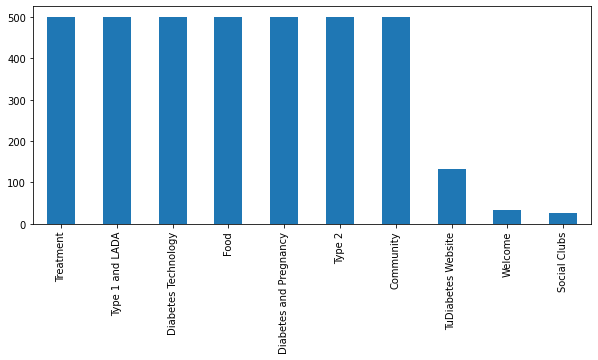

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,4))
df['Category'].value_counts().plot(kind='bar');

# Remove df['category']='Social Clubs','Welcome','Tudiabetes website'

In [ ]:
df_cat = df[df.Category != 'Social Clubs']
df_cat = df_cat[df.Category != 'TuDiabetes Website']
df_cat = df_cat[df.Category != 'Welcome']

df_cat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies
192,Type 1 Diabetes Resources,Type 1 and LADA,,Information on this page represents a sample o...,,"Dec 21, 2009 3:04 pm",2,9.2k,6
193,About the Type 1 and LADA category,Type 1 and LADA,,The Type 1 Diabetes and LADA category is inten...,,"Apr 14, 2015 5:51 pm",1,7.1k,1
194,Are you concerned about Covid-19 Vaccine might...,Type 1 and LADA,,I am wondering if others with multiple autoimm...,"Yeah. However, given that this is a pandemic, ...","Jan 14, 2021 6:40 am",32,349,17
195,Covid Vaccine - are you getting it?,Type 1 and LADA,,Hello!\nI wanted to get people who have type 1...,I am Type 2 but the question is just a relevan...,"Jan 2, 2021 8:39 pm",203,1.9k,120
196,Bolusing for pasta - big fail,Type 1 and LADA,,How do you guys bolus for pasta? I had some e...,"With pasta (any kind of spaghetti, light on th...","Jan 16, 2021 6:30 am",11,147,13
...,...,...,...,...,...,...,...,...,...
3694,Frequent Occlusions with Tandem X2,Diabetes Technology,,A few months ago my son switched from a Medtro...,"What infusion sets are he using?, The Tandem i...","Dec 11, 2019 3:52 pm",7,700,15
3695,Any loopers using this button?,Diabetes Technology,DIY Closed Loop Systems,Anybody using this button (right of the meal b...,"I use this button many times, every day. It’s ...","Dec 7, 2019 11:46 am",0,645,24
3696,Which infusion set?,Diabetes Technology,Insulin Pumps,I have Tandem T2 pump. Started using the steel...,I use the Autosoft 30. A spring sends it in a...,"Dec 12, 2018 6:10 pm",7,1.8k,17
3697,Availability of diabetes products in Canada. I...,Diabetes Technology,,So I love new advancements in D-technology. Bu...,Yes - frustrated.\nI would like to try Tresiba...,"Oct 6, 2016 9:14 pm",16,7.0k,33


In [ ]:
print("After removing 'Social Clubs', 'TuDiabetes Website', 'Welcome' categories we remove vvv rows ")
len(df)-len(df_cat)

After removing 'Social Clubs', 'TuDiabetes Website', 'Welcome' categories we remove vvv rows 


192

In [ ]:
my_categories = [ 'Type 1 and LADA',
'Type 2', 'Diabetes and Pregnancy', 'Community', 'Food',
'Treatment', 'Diabetes Technology']

# Create combined dataset 

df_cat['comment_topic'],

df_cat['comment_tag'],

df_cat['comment_lead']

In [ ]:
df_cat['comment_topic'] = df_cat['Topic Title'] + ' ' + df_cat['Tags'] + ' ' + df_cat['Leading Post'] + ' ' + df_cat['Post Replies']
df_cat['comment_tag'] = df_cat['Tags'] + ' ' + df_cat['Leading Post'] + ' ' + df_cat['Post Replies']
df_cat['comment_lead'] = df_cat['Leading Post'] + ' ' + df_cat['Post Replies']
df_cat.head()


,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies,comment_topic,comment_tag,comment_lead
192,Type 1 Diabetes Resources,Type 1 and LADA,,Information on this page represents a sample o...,,"Dec 21, 2009 3:04 pm",2,9.2k,6,Type 1 Diabetes Resources Information on this...,Information on this page represents a sample ...,Information on this page represents a sample o...
193,About the Type 1 and LADA category,Type 1 and LADA,,The Type 1 Diabetes and LADA category is inten...,,"Apr 14, 2015 5:51 pm",1,7.1k,1,About the Type 1 and LADA category The Type 1...,The Type 1 Diabetes and LADA category is inte...,The Type 1 Diabetes and LADA category is inten...
194,Are you concerned about Covid-19 Vaccine might...,Type 1 and LADA,,I am wondering if others with multiple autoimm...,"Yeah. However, given that this is a pandemic, ...","Jan 14, 2021 6:40 am",32,349,17,Are you concerned about Covid-19 Vaccine might...,I am wondering if others with multiple autoim...,I am wondering if others with multiple autoimm...
195,Covid Vaccine - are you getting it?,Type 1 and LADA,,Hello!\nI wanted to get people who have type 1...,I am Type 2 but the question is just a relevan...,"Jan 2, 2021 8:39 pm",203,1.9k,120,Covid Vaccine - are you getting it? Hello!\nI...,Hello!\nI wanted to get people who have type ...,Hello!\nI wanted to get people who have type 1...
196,Bolusing for pasta - big fail,Type 1 and LADA,,How do you guys bolus for pasta? I had some e...,"With pasta (any kind of spaghetti, light on th...","Jan 16, 2021 6:30 am",11,147,13,Bolusing for pasta - big fail How do you guys...,How do you guys bolus for pasta? I had some ...,How do you guys bolus for pasta? I had some e...


# WordCloud_ df_cat['comment_lead'] 

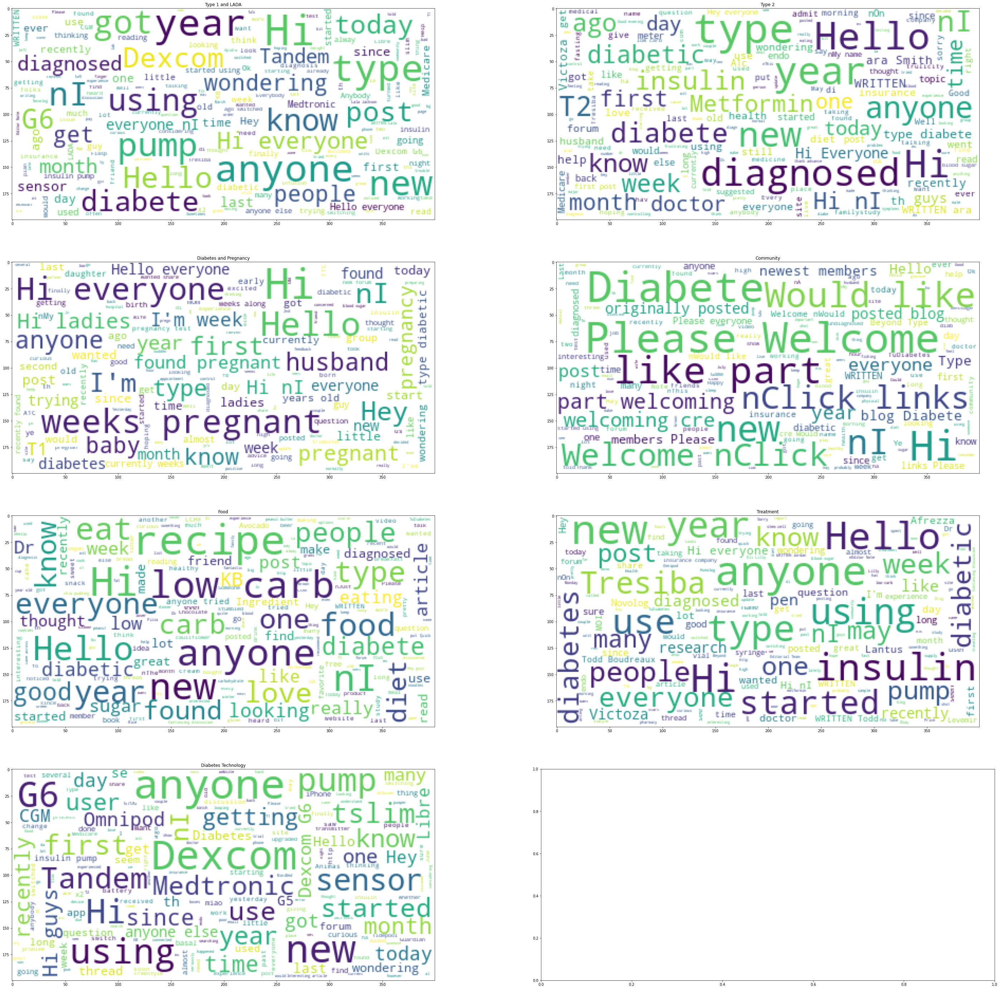

In [ ]:
fig, axs = plt.subplots(4,2, figsize=(50, 50), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)


for axs, x in zip(axs.ravel(),df_cat['Category'].unique()):
  wc = WordCloud(background_color="white", max_words=2000, stopwords=stop_words,
                   max_font_size=40, random_state=42)
  wc.generate(df_cat.comment_lead[(df_cat.comment_lead.notnull()) & (df_cat['Category'] == x)].to_string())
   
  axs.imshow(wc)
  axs.set_title(str(x))

# WordCloud_ df_cat['comment_tag']

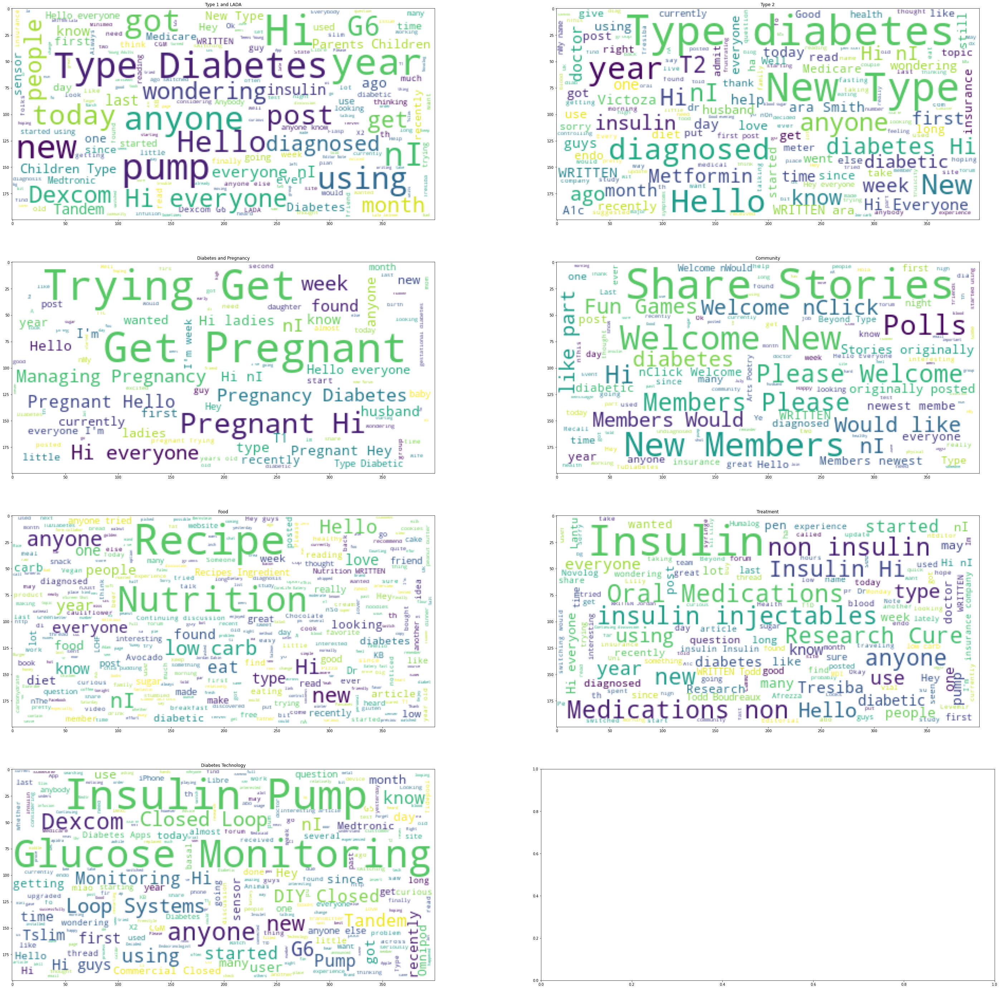

In [ ]:
fig, axs = plt.subplots(4,2, figsize=(50, 50), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)


for axs, x in zip(axs.ravel(),df_cat['Category'].unique()):
  wc = WordCloud(background_color="white", max_words=2000, stopwords=stop_words,
                   max_font_size=40, random_state=42)
  wc.generate(df_cat.comment_tag[(df_cat.comment_tag.notnull()) & (df_cat['Category'] == x)].to_string())
   
  axs.imshow(wc)
  axs.set_title(str(x))

# Clean data

In [ ]:
!pip install contractions
import contractions

     |████████████████████████████████| 245kB 7.3MB/s 
     |████████████████████████████████| 327kB 10.8MB/s 
  Created wheel for pyahocorasick: filename=pyahocorasick-1.4.1-cp36-cp36m-linux_x86_64.whl size=84347 sha256=6530167507b056b92bd958cc67a5083b8e169f9b460b44515723e2d52468cf8f
  Stored in directory: /root/.cache/pip/wheels/e4/ab/f7/cb39270df8f6126f3dd4c33d302357167086db460968cfc80c
Successfully built pyahocorasick


In [ ]:
import string

In [ ]:
def clean_text(text):
    #Make text lowercase, remove punctuation and remove words containing numbers.
    text=re.sub("[\(\[].*?[\)\]]", "",text)
    text=re.sub(r'#\w+ ?', '', text ) ## remove hashtag words
    text = re.sub('<.*?>','', text)
    text = text.lower()
    text = re.sub('[%s]' % re.escape(string.punctuation), '',text)#remove punctuation
   # Get rid of some additional punctuation.
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub(' — ', '', text)
    return (text)

clean = lambda x: clean_text(x)

def full_clean(s):
  df = s.apply(lambda x: [contractions.fix(word) for word in str(x).split()])
  df= df.map(lambda x: ' '.join(x))
  stop_words.update(['hi','hello']) 

  df=df.apply(clean)
  df = df.apply(lambda x: ' '.join([word for word in str(x).split() if word not in (stop_words)]))
  
  return(pd.DataFrame(df))


In [ ]:
def clean_text1(text):
    #Make text lowercase, remove punctuation and remove words containing numbers.
    # text = re.compile('<.*?>')
    text=re.sub("[\(\[].*?[\)\]]", "",text)
    text=re.sub(r'#\w+ ?', '', text ) ## remove hashtag words
    text = re.sub('<.*?>','', text)
    text = text.lower()
    text = re.sub('[%s]' % re.escape(string.punctuation), '',text)#remove punctuation
    # text = re.sub('\w*\d\w*', '', text)
   # Get rid of some additional punctuation.
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub(' — ', '', text)
    return (text)

clean1 = lambda x: clean_text1(x)

def full_clean1(s):
  df = s.apply(lambda x: [contractions.fix(word) for word in str(x).split()])
  df= df.map(lambda x: ' '.join(x))
  df=df.apply(clean1)
  return(pd.DataFrame(df))

In [ ]:
df_cat['comment_topic_C'] =full_clean(df_cat['comment_topic'])
df_cat['comment_tag_C'] = full_clean(df_cat['comment_tag'])
df_cat['comment_lead_C']= full_clean(df_cat['comment_lead'])



In [ ]:
df_cat['comment_topic_C1'] =full_clean1(df_cat['comment_topic'])
df_cat['comment_tag_C1'] = full_clean1(df_cat['comment_tag'])
df_cat['comment_lead_C1']= full_clean1(df_cat['comment_lead'])

In [ ]:
df_cat.head()

,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies,comment_topic,comment_tag,comment_lead,comment_topic_C,comment_tag_C,comment_lead_C,comment_topic_C1,comment_tag_C1,comment_lead_C1
192,Type 1 Diabetes Resources,Type 1 and LADA,,Information on this page represents a sample o...,,"Dec 21, 2009 3:04 pm",2,9.2k,6,Type 1 Diabetes Resources Information on this...,Information on this page represents a sample ...,Information on this page represents a sample o...,type 1 diabetes resources information page rep...,information page represents sample content ava...,information page represents sample content ava...,type 1 diabetes resources information on this ...,information on this page represents a sample o...,information on this page represents a sample o...
193,About the Type 1 and LADA category,Type 1 and LADA,,The Type 1 Diabetes and LADA category is inten...,,"Apr 14, 2015 5:51 pm",1,7.1k,1,About the Type 1 and LADA category The Type 1...,The Type 1 Diabetes and LADA category is inte...,The Type 1 Diabetes and LADA category is inten...,type 1 lada category type 1 diabetes lada cate...,type 1 diabetes lada category intended discuss...,type 1 diabetes lada category intended discuss...,about the type 1 and lada category the type 1 ...,the type 1 diabetes and lada category is inten...,the type 1 diabetes and lada category is inten...
194,Are you concerned about Covid-19 Vaccine might...,Type 1 and LADA,,I am wondering if others with multiple autoimm...,"Yeah. However, given that this is a pandemic, ...","Jan 14, 2021 6:40 am",32,349,17,Are you concerned about Covid-19 Vaccine might...,I am wondering if others with multiple autoim...,I am wondering if others with multiple autoimm...,concerned covid19 vaccine might wake autoimmue...,wondering others multiple autoimmune diseases ...,wondering others multiple autoimmune diseases ...,are you concerned about covid19 vaccine might ...,i am wondering if others with multiple autoimm...,i am wondering if others with multiple autoimm...
195,Covid Vaccine - are you getting it?,Type 1 and LADA,,Hello!\nI wanted to get people who have type 1...,I am Type 2 but the question is just a relevan...,"Jan 2, 2021 8:39 pm",203,1.9k,120,Covid Vaccine - are you getting it? Hello!\nI...,Hello!\nI wanted to get people who have type ...,Hello!\nI wanted to get people who have type 1...,covid vaccine getting wanted get people type 1...,wanted get people type 1 opinions whether goin...,wanted get people type 1 opinions whether goin...,covid vaccine are you getting it hello i want...,hello i wanted to get people who have type 1 t...,hello i wanted to get people who have type 1 t...
196,Bolusing for pasta - big fail,Type 1 and LADA,,How do you guys bolus for pasta? I had some e...,"With pasta (any kind of spaghetti, light on th...","Jan 16, 2021 6:30 am",11,147,13,Bolusing for pasta - big fail How do you guys...,How do you guys bolus for pasta? I had some ...,How do you guys bolus for pasta? I had some e...,bolusing pasta big fail guys bolus pasta elbow...,guys bolus pasta elbow pasta tonight little bi...,guys bolus pasta elbow pasta tonight little bi...,bolusing for pasta big fail how do you guys b...,how do you guys bolus for pasta i had some elb...,how do you guys bolus for pasta i had some elb...


# Prepare for Modeling

In [ ]:
X = df_cat['comment_lead_C']
y = df_cat['Category']
X_train, X_test, y_train, y_test = train_test_split(X, y,stratify=y, test_size=0.25, random_state = 42)

In [ ]:
X0 = df_cat['comment_topic_C1']
y0 = df_cat['Category']
X_train0, X_test0, y_train0, y_test0 = train_test_split(X0, y0,stratify=y0, test_size=0.25, random_state = 42)

In [ ]:
X1 = df_cat['comment_tag_C']
y1 = df_cat['Category']
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1,stratify=y1, test_size=0.25, random_state = 42)

In [ ]:
X2 = df_cat['comment_topic_C']
y2 = df_cat['Category']
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2,stratify=y2, test_size=0.25, random_state = 42)

# SVM

### X1

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

svc = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
                ('svc',SVC())])
svc.fit(X_train1, y_train1)


from sklearn.metrics import classification_report
y_pred = svc.predict(X_test1)

print('accuracy %s' % accuracy_score(y_test1,y_pred))
res_svc_test1 = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred = svc.predict(X_train1)
res_svc_train1 = accuracy_score(y_train1,y_pred)
print('accuracy %s' % res_svc_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

accuracy 0.6510832383124288
accuracy 0.9726235741444867


In [ ]:
# print(svc.score(X_test1,y_test1))
# print(svc.score(X_train1,y_train1))

### X2

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

svc = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
                ('svc',SVC())])
svc.fit(X_train2, y_train2)


from sklearn.metrics import classification_report
y_pred2 = svc.predict(X_test2)

print('test accuracy %s' % accuracy_score(y_test2,y_pred2))
res_svc_test2 = accuracy_score(y_test2,y_pred2)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred2= svc.predict(X_train2)
res_svc_train2 = accuracy_score(y_train2,y_pred)
print('trained accuracy %s' % res_svc_train2)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

test accuracy 0.6602052451539339
trained accuracy 0.9726235741444867


### X0

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

svc = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
                ('svc',SVC())])
svc.fit(X_train0, y_train0)


from sklearn.metrics import classification_report
y_pred0 = svc.predict(X_test0)

print('test accuracy %s' % accuracy_score(y_test0,y_pred0))
res_svc_test0 = accuracy_score(y_test0,y_pred0)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred0= svc.predict(X_train0)
res_svc_train0 = accuracy_score(y_train0,y_pred0)
print('trained accuracy %s' % res_svc_train0)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

test accuracy 0.6602052451539339
trained accuracy 0.9498098859315589


# Naive Bayes Classifier for Multinomial Models

### CountVectorizer + TF-IDFTransformer + MultinomialNB

The TfidfTransformer transforms a count matrix to a normalized tf or tf-idf representation. So although both the CountVectorizer and TfidfTransformer (with use_idf=False) produce term frequencies, TfidfTransformer is normalizing the count. 
https://stackoverflow.com/questions/18172851/deleting-dataframe-row-in-pandas-based-on-column-value

### X1 

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train1, y_train1)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test1)

print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_nb_test1 = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred = nb.predict(X_train1)
res_nb_train1 = accuracy_score(y_train1,y_pred)
print('Trained accuracy %s' % res_nb_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

Test accuracy 0.6145952109464082
Trained accuracy 0.7847908745247149


### X2 

In [ ]:
nb.fit(X_train2, y_train2)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_nb_test2= accuracy_score(y_test2,y_pred)
# print(classification_report(y_test2, y_pred,target_names=my_categories))
y_pred = nb.predict(X_train2)
res_nb_train2 = accuracy_score(y_train2,y_pred)
print('Trained accuracy %s' % res_nb_train2)
# print(classification_report(y_train2, y_pred,target_names=my_categories))

Test accuracy 0.6145952109464082
Trained accuracy 0.7832699619771863


### X0

In [ ]:
nb.fit(X_train0, y_train0)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred))
res_nb_test0 = accuracy_score(y_test0,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))

y_pred = nb.predict(X_train0)
res_nb_train0 = accuracy_score(y_train0,y_pred)
print('Trained accuracy %s' % res_nb_train0)
# print(classification_report(y_train0, y_pred,target_names=my_categories))

Test accuracy 0.5997719498289624
Trained accuracy 0.7437262357414449


#### grid **search**

In [ ]:
from sklearn.model_selection import GridSearchCV
nb = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
               ('clf', MultinomialNB()),
              ])

parameters = {'vect__ngram_range': [(1, 1), (1, 2),(2,2),(2,3)],
              'tfidf__use_idf': (True, False),
               'clf__alpha': (1e-2, 1e-3),
 }

gs_clf = GridSearchCV(nb, parameters,scoring='accuracy', n_jobs=-1)

gs_clf.fit(X_train1, y_train1)


from sklearn.metrics import classification_report
y_pred = gs_clf.predict(X_test1)

print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_nb_test = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred = gs_clf.predict(X_train1)
res_nb_train = accuracy_score(y_train1,y_pred)
print('Trained accuracy %s' % res_nb_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Test accuracy 0.6545039908779932
Trained accuracy 0.7847908745247149


In [ ]:
gs_clf.best_score_

0.6593155893536122

In [ ]:

gs_clf.best_params_

{'clf__alpha': 0.001, 'tfidf__use_idf': False, 'vect__ngram_range': (1, 2)}

# SGDClassifier

### CountVectorizer + TF-IDFTransformer + SGDClassifier

### X1

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='modified_huber', penalty='l1',alpha=1e-3, random_state=42, max_iter=10, tol=None)),
               ])
sgd.fit(X_train1, y_train1)

y_pred = sgd.predict(X_test1)

print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_SGD_test1 = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))

y_pred = sgd.predict(X_train1)
res_SGD_train1 = accuracy_score(y_train1,y_pred)
print('Trained accuracy %s' % res_SGD_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

Test accuracy 0.6818700114025086
Trained accuracy 0.749809885931559


### X0

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='modified_huber', penalty='l1',alpha=1e-3, random_state=42, max_iter=10, tol=None)),
               ])
sgd.fit(X_train0, y_train0)

y_pred = sgd.predict(X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred))
res_SGD_test0 = accuracy_score(y_test0,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))
y_pred = sgd.predict(X_train0)
res_SGD_train0 = accuracy_score(y_train0,y_pred)
print('Trained accuracy %s' % res_SGD_train0)
# print(classification_report(y_train0, y_pred,target_names=my_categories))

Test accuracy 0.6807297605473204
Trained accuracy 0.7444866920152091


he possible options are 'hinge', 'log', 'modified_huber',
'squared_hinge', 'perceptron', or a regression loss: 'squared_loss',
'huber', 'epsilon_insensitive', or 'squared_epsilon_insensitive'.

The 'log' loss gives logistic regression, a probabilistic classifier.
'modified_huber' is another smooth loss that brings tolerance to
outliers as well as probability estimates.
'squared_hinge' is like hinge but is quadratically penalized.
'perceptron' is the linear loss used by the perceptron algorithm.
The other losses are designed for regression but can be useful in
classification as well; see SGDRegressor for a description.


penalty : {'l2', 'l1', 'elasticnet'}, default='l2'
    The penalty (aka regularization term) to be used. Defaults to 'l2'
    which is the standard regularizer for linear SVM models. 'l1' and
    'elasticnet' might bring sparsity to the model (feature selection)
    not achievable with 'l2'.

### X2

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='modified_huber', penalty='l1',alpha=1e-3, random_state=42, max_iter=10, tol=None)),
               ])
sgd.fit(X_train2, y_train2)

y_pred = sgd.predict(X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_SGD_test2 = accuracy_score(y_test2,y_pred)
# print(classification_report(y_test2, y_pred,target_names=my_categories))
y_pred = sgd.predict(X_train2)
res_SGD_train2 = accuracy_score(y_train2,y_pred)
print('Trained accuracy %s' % res_SGD_train2)
# print(classification_report(y_train2, y_pred,target_names=my_categories))

Test accuracy 0.6864310148232611
Trained accuracy 0.7475285171102661


### Gridsearch

https://scikit-learn.org/stable/auto_examples/model_selection/grid_search_text_feature_extraction.html

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier()),
               ])


parameters = {'vect__max_df': (0.5, 0.75, 1.0),
    # 'vect__max_features': (None, 5000, 10000, 50000),
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    # 'tfidf__use_idf': (True, False),
    # 'tfidf__norm': ('l1', 'l2'),
    'clf__max_iter': (20,),
    'clf__alpha': (0.00001, 0.000001),
    'clf__penalty': ('l2', 'elasticnet'),
    # 'clf__max_iter': (10, 50, 80),
 }

gs_clf = GridSearchCV(sgd, parameters,scoring='accuracy', n_jobs=-1)

gs_clf.fit(X_train1, y_train1)



y_pred = gs_clf.predict(X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_SGD_testG = accuracy_score(y_test2,y_pred)
# print(classification_report(y_test2, y_pred,target_names=my_categories))
y_pred = gs_clf.predict(X_train2)
res_SGD_trainG = accuracy_score(y_train2,y_pred)
print('Trained accuracy %s' % res_SGD_train2)
# print(classification_report(y_train2, y_pred,target_names=my_categories))

Test accuracy 0.6978335233751425
Trained accuracy 0.7475285171102661


In [ ]:
gs_clf.best_score_

0.6874524714828898

In [ ]:
gs_clf.best_params_

{'clf__alpha': 1e-05,
 'clf__max_iter': 20,
 'clf__penalty': 'l2',
 'vect__max_df': 0.5,
 'vect__ngram_range': (1, 2)}

# Logistic Regression

### CountVectorizer + TF-IDFTransformer + Logistic Regression

https://stackoverflow.com/questions/20894671/speeding-up-sklearn-logistic-regression

solver---> https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

### X1

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                # ('svd', TruncatedSVD(n_components = 100)),
                ('clf', LogisticRegression(penalty='l1',solver='liblinear')),#  C--> Inverse of regularization strength; must be a positive float.
                                                              # LogisticRegression now says that njobs chooses the "Number of CPU cores used during the cross-validation loop"
                                                              # whereas the other two items cited in the original response, RandomForestClassifier() 
                                                              #and RandomForestRegressor(), both state that njobs specifies "The number of jobs to run in parallel for both fit and predict". In other words, the deliberate contrast in phrasing here seems to be pointing out that the njobs parameter in LogisticRegression(), while now implemented, is not really implemented as completely, or in the same way, as in the other two cases.
                                                           ]) #penalty='l1',solver='liblinear',n_jobs=1, C=100

logreg.fit(X_train1, y_train1)

y_pred = logreg.predict (X_test1)


print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_logreg_test1 = accuracy_score(y_test1,y_pred)

# print(classification_report(y_test1, y_pred,target_names=my_categories))

y_pred = sgd.predict(X_train1)

res_logreg_train1 = accuracy_score(y_train1,y_pred)
print('Trained accuracy %s' % res_logreg_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

Test accuracy 0.6887115165336374
Trained accuracy 0.7460076045627376


In [ ]:
# import seaborn as sns
# conf_mat = confusion_matrix(y_test1, y_pred)
# fig, ax = plt.subplots(figsize=(10,10))
# sns.heatmap(conf_mat, annot=True, fmt='d',cmap="YlGnBu",
#             xticklabels=my_categories, yticklabels=my_categories) ## color--> https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/
# plt.ylabel('Actual')
# plt.xlabel('Predicted')
# plt.show() 


### X2

In [ ]:
from sklearn.linear_model import SGDClassifier

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(penalty='l1',solver='liblinear')),
               ])
logreg.fit(X_train2, y_train2)

y_pred = logreg.predict(X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_logreg_test2 = accuracy_score(y_test2,y_pred)

# print(classification_report(y_test2, y_pred,target_names=my_categories))
y_pred = sgd.predict(X_train2)

res_logreg_train2 = accuracy_score(y_train2,y_pred)
print('Trained accuracy %s' % res_logreg_train2)
# print(classification_report(y_train2, y_pred,target_names=my_categories)) 


Test accuracy 0.6875712656784493
Trained accuracy 0.7475285171102661


### X0

In [ ]:
from sklearn.linear_model import SGDClassifier

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(penalty='l1',solver='liblinear')),
               ])
logreg.fit(X_train0, y_train0)

y_pred = logreg.predict(X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred))
res_logreg_test0 = accuracy_score(y_test0,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))


y_pred = sgd.predict(X_train2)

res_logreg_train0 = accuracy_score(y_train0,y_pred)
print('Trained accuracy %s' % res_logreg_train0)
# print(classification_report(y_train0, y_pred,target_names=my_categories))

Test accuracy 0.661345496009122
Trained accuracy 0.7475285171102661


# XGBClassifier

#### CountVectorizer + TF-IDFTransformer + XGBClassifier

**for overfitting**
https://stats.stackexchange.com/questions/443259/how-to-avoid-overfitting-in-xgboost-model

**Parameters of XGB** 
https://xgboost.readthedocs.io/en/latest/parameter.html

###X1 

In [ ]:
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
XGB.fit(X_train1, y_train1)

y_pred = XGB.predict (X_test1)

print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_XGB_test1 = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred1 = XGB.predict(X_train1)

res_XGB_train1 = accuracy_score(y_train1,y_pred1)
print('Trained accuracy %s' % res_XGB_train1)
# print(classification_report(y_train1, y_pred1,target_names=my_categories))

Test accuracy 0.7172177879133409
Trained accuracy 0.7547528517110266


### X2

In [ ]:
from xgboost import XGBClassifier

XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
XGB.fit(X_train2, y_train2)

y_pred = XGB.predict (X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_XGB_test2 = accuracy_score(y_test2,y_pred)
# print(classification_report(y_test2, y_pred,target_names=my_categories))
y_pred2 = XGB.predict(X_train2)

res_XGB_train2 = accuracy_score(y_train2,y_pred2)
print('Trained accuracy %s' % res_XGB_train2)
# print(classification_report(y_train2, y_pred2,target_names=my_categories))

Test accuracy 0.7115165336374002
Trained accuracy 0.7555133079847909


### X0

In [ ]:
from xgboost import XGBClassifier

XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
XGB.fit(X_train0, y_train0)

y_pred = XGB.predict (X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred))
res_XGB_test0 = accuracy_score(y_test0,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))

y_pred0 = XGB.predict(X_train0)

res_XGB_train0 = accuracy_score(y_train0,y_pred0)
print('Trained accuracy %s' % res_XGB_train0)
# print(classification_report(y_train0, y_pred0,target_names=my_categories))

Test accuracy 0.7206385404789054
Trained accuracy 0.752851711026616


### GridSearchCV

In [ ]:
print(XGB.get_params().keys())

In [ ]:
import time
start = time.process_time()


from sklearn.model_selection import RandomizedSearchCV
XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier()),
               ])


parameters = { #'vect__max_df': (0.5, 0.75, 1.0),
    
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    'tfidf__use_idf': (True, False),
    # 'tfidf__norm': ('l1', 'l2'),
    'clf__max_depth':(1,2,3),
    # 'clf__min_child_weight': (1,2),
    
    # 'clf_subsample': 1,
    # 'clf_colsample_bytree': 1,
    'clf__gamma':(.1,.5,.8),
    # Other parameters
    'clf__objective':('reg:linear','multi:softprob'),
 }


gs_clf = GridSearchCV(XGB, parameters,scoring='accuracy')

gs_clf.fit(X_train2, y_train2)


y_pred = gs_clf.predict (X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred))
res_XGB_test2_G = accuracy_score(y_test2,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))

y_pred2 = XGB.predict(X_train2)

res_XGB_train2_G = accuracy_score(y_train2,y_pred2)
print('Trained accuracy %s' % res_XGB_train2_G)
# print(classification_report(y_train0, y_pred0,target_names=my_categories))
print(time.process_time() - start)

In [ ]:
from xgboost import XGBClassifier

XGB = Pipeline([('vect', CountVectorizer(analyzer='word', token_pattern=r'\w{1,}', ngram_range=(2,4), max_features=5000)),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
XGB.fit(X_train0, y_train0)

y_pred = XGB.predict (X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred))
res_XGB_test = accuracy_score(y_test0,y_pred)
# print(classification_report(y_test0, y_pred,target_names=my_categories))

y_pred0 = XGB.predict(X_train0)

res_XGB_train = accuracy_score(y_train0,y_pred0)
print('Trained accuracy %s' % res_XGB_train)
# print(classification_report(y_train0, y_pred0,target_names=my_categories))

# RandomForestClassifier

#### CountVectorizer + TF-IDFTransformer + RandomForestClassifier

### X1

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators=1500,max_depth=1,min_samples_leaf=30)),
               ])
RFC.fit(X_train1, y_train1)

y_pred = RFC.predict (X_test1)

print('Test accuracy %s' % accuracy_score(y_test1,y_pred))
res_RFC_test1 = accuracy_score(y_test1,y_pred)
# print(classification_report(y_test1, y_pred,target_names=my_categories))
y_pred = RFC.predict(X_train1)
res_RFC_train1 = accuracy_score(y_train1, y_pred)
print('Trained accuracy %s' % res_RFC_train1)
# print(classification_report(y_train1, y_pred,target_names=my_categories))

Test accuracy 0.6157354618015963
Trained accuracy 0.644106463878327


n_estimators: The more trees, the less likely the algorithm is to overfit. So try increasing this parameter. The lower this number, the closer the model is to a decision tree, with a restricted feature set.
max_features: You should try reducing this number. This defines how many features each tree is randomly assigned. 
max_depth: This parameter will reduce the complexity of the learned models, lowering over fitting risk. 
min_samples_leaf: Try setting these values greater than one. This has a similar effect to the max_depth parameter, it means the branch will stop splitting once the leaves have that number of samples each.

### X2

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators=1500,max_depth=1,min_samples_leaf=30)),
               ])
RFC.fit(X_train2, y_train2)

y_pred2 = RFC.predict (X_test2)

print('Test accuracy %s' % accuracy_score(y_test2,y_pred2))
res_RFC_test2 = accuracy_score(y_test2,y_pred2)
# print(classification_report(y_test2, y_pred2,target_names=my_categories))

y_pred2 = RFC.predict(X_train2)
res_RFC_train2 = accuracy_score(y_train2, y_pred2)
print('Trained accuracy %s' % res_RFC_train2)
# print(classification_report(y_train2, y_pred2,target_names=my_categories))

Test accuracy 0.6180159635119726
Trained accuracy 0.6437262357414448


### X0

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators=1500,max_depth=1,min_samples_leaf=30)),
               ])
RFC.fit(X_train0, y_train0)

y_pred0 = RFC.predict (X_test0)

print('Test accuracy %s' % accuracy_score(y_test0,y_pred0))
res_RFC_test0 = accuracy_score(y_test0,y_pred0)
# print(classification_report(y_test2, y_pred2,target_names=my_categories))

y_pred0 = RFC.predict(X_train0)
res_RFC_train0 = accuracy_score(y_train0, y_pred0)
print('Trained accuracy %s' % res_RFC_train0)
# print(classification_report(y_train2, y_pred2,target_names=my_categories))

Test accuracy 0.61345496009122
Trained accuracy 0.6376425855513308


# Comparing multiple models accuracy score

In [ ]:
import pandas as pd

results = pd.DataFrame({'Model': ['Naive Bayes MultinomialNB', 'Linear SVM', 'SGDClassifier','Logistic Regression','XGBClassifier','RandomForestClassifier'],
                         'Test_X1': [res_nb_test1,res_svc_test1,res_SGD_test1,res_logreg_test1,res_XGB_test1,res_RFC_test1],
                         'Train_X1':[res_nb_train1,res_svc_train1,res_SGD_train1,res_logreg_train1,res_XGB_train1,res_RFC_train1],
                         'Test_X2': [res_nb_test2,res_svc_test2,res_SGD_test2,res_logreg_test2,res_XGB_test2,res_RFC_test2],
                         'Train_X2':[res_nb_train2,res_svc_train2,res_SGD_train2,res_logreg_train2,res_XGB_train2,res_RFC_train2],
                         'Test_X0': [res_nb_test0,res_svc_test0,res_SGD_test0,res_logreg_test0,res_XGB_test0,res_RFC_test0],
                         'Train_X0':[res_nb_train0,res_svc_train0,res_SGD_train0,res_logreg_train0,res_XGB_train0,res_RFC_train0],
                        })
results.set_index('Model')
results.sort_values(by='Test_X2')

,Model,Test_X1,Train_X1,Test_X2,Train_X2,Test_X0,Train_X0
0,Naive Bayes MultinomialNB,0.614595,0.784791,0.614595,0.783270,0.599772,0.743726
5,RandomForestClassifier,0.615735,0.644106,0.618016,0.643726,0.613455,0.637643
1,Linear SVM,0.651083,0.972624,0.660205,0.972624,0.660205,0.949810
2,SGDClassifier,0.681870,0.749810,0.686431,0.747529,0.680730,0.744487
3,Logistic Regression,0.688712,0.746008,0.687571,0.747529,0.661345,0.747529
4,XGBClassifier,0.717218,0.754753,0.711517,0.755513,0.720639,0.752852


x0=comment_topic_with_stop_words,

x1=comment_topic_without_stop_words,

x2=comment_tag_C_without_stop_words

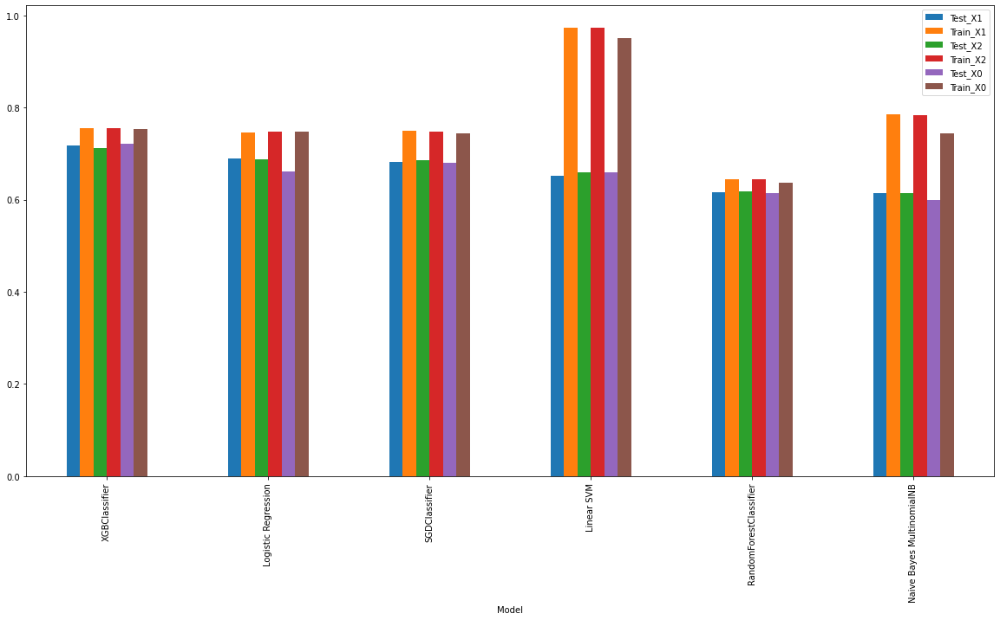

In [ ]:


import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
results.sort_values(by='Test_X2',ascending=False).plot.bar(x='Model')

# Cross Validation_X2
https://scikit-learn.org/stable/modules/cross_validation.html,

https://towardsdatascience.com/cross-validation-explained-evaluating-estimator-performance-e51e5430ff85

### CV_NB

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.model_selection import cross_val_score

nb = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
               ('clf', MultinomialNB()),
              ])


cv_res_nb = cross_val_score(nb, X_train2, y_train2,scoring='accuracy', cv=10)
mean_cv_res_nb = np.mean(cv_res_nb)
print(mean_cv_res_nb)

0.6285171102661596


In [ ]:
std_cv_res_nb = np.std(cv_res_nb)
print(std_cv_res_nb)

0.01683771089390459


In [ ]:
cv_res_NB = cross_val_score(nb, X2, y2,scoring='accuracy', cv=10)
std_cv_res_NB=np.std(cv_res_NB)
mean_cv_res_NB = np.mean(cv_res_NB)
print(mean_cv_res_NB)
print(std_cv_res_NB)

0.6222197802197802
0.0320288019154578


### CV_SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

svc = Pipeline([('vect', CountVectorizer()), ##
               ('tfidf', TfidfTransformer()), ##
                ('svc',SVC())])



cv_res_svc = cross_val_score(svc, X_train2, y_train2,scoring='accuracy', cv=10)
mean_cv_res_svc = np.mean(cv_res_svc)
print(mean_cv_res_svc)


0.6684410646387832


In [ ]:
std_cv_res_svc = np.std(cv_res_svc)
print(std_cv_res_svc)

0.010454545311686318


In [ ]:
cv_res_SVC = cross_val_score(svc, X2, y2,scoring='accuracy', cv=10)
std_cv_res_SVC=np.std(cv_res_SVC)
mean_cv_res_SVC = np.mean(cv_res_SVC)
print(mean_cv_res_SVC)
print(std_cv_res_SVC)

0.6678201058201058
0.014039562215036968


### CV_RF

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators=1500,max_depth=1,min_samples_leaf=30)),
               ])

cv_res_RFC = cross_val_score(RFC, X_train2, y_train2,scoring='accuracy', cv=10)
mean_cv_res_RFC = np.mean(cv_res_RFC)
print(mean_cv_res_RFC)

0.6182509505703422


In [ ]:
std_cv_res_RFC = np.std(cv_res_RFC)
print(std_cv_res_RFC)

0.01969860661138954


In [ ]:
cv_res_rfc = cross_val_score(RFC, X2, y2,scoring='accuracy', cv=10)
std_cv_res_rfc=np.std(cv_res_rfc)
mean_cv_res_rfc = np.mean(cv_res_rfc)
print(mean_cv_res_rfc)
print(std_cv_res_rfc)

0.6082287342287342
0.022776818421289674


### CV_SGDClassifier

In [ ]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='modified_huber', penalty='l1',alpha=1e-3, max_iter=10, tol=None)), # random_state=42
               ])

cv_res_sgd = cross_val_score(sgd, X_train2, y_train2,scoring='accuracy', cv=10)
mean_cv_res_sgd = np.mean(cv_res_sgd)
print(mean_cv_res_sgd)

0.6923954372623575


In [ ]:
std_cv_res_sgd=np.std(cv_res_sgd)
print(std_cv_res_sgd)

0.026257774403984087


In [ ]:
cv_res_SGD = cross_val_score(sgd, X2, y2,scoring='accuracy', cv=10)
std_cv_res_SGD=np.std(cv_res_SGD)
mean_cv_res_SGD = np.mean(cv_res_SGD)
print(mean_cv_res_SGD)
print(std_cv_res_SGD)

0.688919006919007
0.015528201800753927


### CV_LogisticRegression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(penalty='l1',solver='liblinear')),
               ])
cv_res_logreg = cross_val_score(logreg, X_train2, y_train2,scoring='accuracy', cv=10)
std_cv_res_logreg=np.std(cv_res_logreg)
mean_cv_res_logreg = np.mean(cv_res_logreg)
print(mean_cv_res_logreg)
print(std_cv_res_logreg)

0.6870722433460077
0.01916666640475826


In [ ]:
cv_res_logreG = cross_val_score(logreg, X2, y2,scoring='accuracy', cv=10)
std_cv_res_logreG=np.std(cv_res_logreG)
mean_cv_res_logreG = np.mean(cv_res_logreG)
print(mean_cv_res_logreG)
print(std_cv_res_logreG)

0.6931973951973952
0.01727180144030112


### CV_XGBClassifier

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
cv_res_XGB = cross_val_score(XGB, X_train2, y_train2,scoring='accuracy', cv=10)
mean_cv_res_XGB = np.mean(cv_res_XGB)
std_cv_res_XGB=np.std(cv_res_XGB)
print(mean_cv_res_XGB)
print(std_cv_res_XGB)

0.702661596958175
0.019223155376067756


In [ ]:
X2 = df_cat['comment_topic_C']
y2 = df_cat['Category']
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

XGB = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', XGBClassifier(objective='multi:softprob',max_depth=1,gamma=0.5,eta=0.1)),
               ])
cv_res_XGb = cross_val_score(XGB, X2, y2,scoring='accuracy', cv=10)
mean_cv_res_XGb = np.mean(cv_res_XGb)
std_cv_res_XGb=np.std(cv_res_XGb)
print(mean_cv_res_XGb)
print(std_cv_res_XGb)

0.7037696377696377
0.028651846389072137


### CV Results

In [ ]:
import pandas as pd

results = pd.DataFrame({'Model': ['CV_NB', 'CV_SVM', 'CV_RF','CV_SGDClassifier','CV_LogisticRegression','CV_XGBClassifier'],
                         'Mean_Accuracy_Train_X2': [mean_cv_res_nb,mean_cv_res_svc,mean_cv_res_RFC,mean_cv_res_sgd,mean_cv_res_logreg,mean_cv_res_XGB],
                        'STD_Train_X2':[std_cv_res_nb,std_cv_res_svc,std_cv_res_RFC,std_cv_res_sgd,std_cv_res_logreg,std_cv_res_XGB],
                        'Mean_Accuracy_X2':[mean_cv_res_NB,mean_cv_res_SVC,mean_cv_res_rfc,mean_cv_res_SGD,mean_cv_res_logreg,mean_cv_res_XGb],
                        'STD_Accuracy_X2':[std_cv_res_NB,std_cv_res_SVC,std_cv_res_rfc,std_cv_res_SGD,std_cv_res_logreg,std_cv_res_XGb]
                         
                        })
results.set_index('Model')
results.sort_values(by='Mean_Accuracy_Train_X2',ascending=False)

,Model,Mean_Accuracy_Train_X2,STD_Train_X2,Mean_Accuracy_X2,STD_Accuracy_X2
5,CV_XGBClassifier,0.702662,0.019223,0.703770,0.028652
3,CV_SGDClassifier,0.692395,0.026258,0.688919,0.015528
4,CV_LogisticRegression,0.687072,0.019167,0.687072,0.019167
1,CV_SVM,0.668441,0.010455,0.667820,0.014040
0,CV_NB,0.628517,0.016838,0.622220,0.032029
2,CV_RF,0.618251,0.019699,0.608229,0.022777


# Display CV_X2  BoxPlot

In [ ]:
dictionary={'CV_NB':cv_res_nb,
            'CV_SVM':cv_res_svc,
            'CV_RF':cv_res_RFC,
            'CV_SGDClassifier':cv_res_sgd,
            'CV_LogisticRegression':cv_res_logreg,
            'CV_XGBClassifier':cv_res_XGB}

In [ ]:
df = pd.DataFrame.from_dict(dictionary)
df

,CV_NB,CV_SVM,CV_RF,CV_SGDClassifier,CV_LogisticRegression,CV_XGBClassifier
0,0.619772,0.661597,0.581749,0.653992,0.673004,0.703422
1,0.623574,0.657795,0.631179,0.703422,0.692015,0.714829
2,0.642586,0.688213,0.615970,0.726236,0.692015,0.718631
3,0.615970,0.669202,0.619772,0.684411,0.703422,0.699620
4,0.661597,0.661597,0.608365,0.699620,0.676806,0.688213
5,0.612167,0.653992,0.634981,0.638783,0.642586,0.669202
6,0.623574,0.673004,0.608365,0.703422,0.718631,0.711027
7,0.653992,0.684411,0.631179,0.722433,0.688213,0.684411
8,0.619772,0.665399,0.653992,0.703422,0.688213,0.741445
9,0.612167,0.669202,0.596958,0.688213,0.695817,0.695817


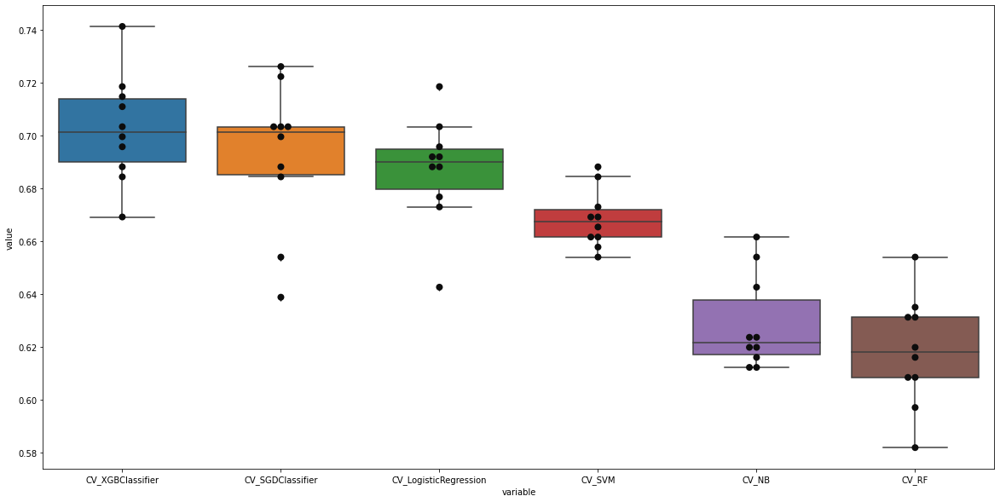

In [ ]:
import seaborn as sns
plt.rcParams["figure.figsize"] = (20,10)

sns.boxplot(x="variable", y="value", data=pd.melt(df),order=list(results.sort_values(by='Mean_Accuracy_Train_X2',ascending=False)['Model']))

sns.swarmplot(x="variable", y="value", data=pd.melt(df),order=list(results.sort_values(by='Mean_Accuracy_Train_X2',ascending=False)['Model']), color=".05",size=8)

plt.show()

### Save XGB Model


In [65]:


# Save the trained model as a pickle string. 

import pickle
# save the classifier
with open('XGB.pkl', 'wb') as fid:
    pickle.dump(XGB, fid)    

# load it again
with open('XGB.pkl', 'rb') as fid:
    XGB_loaded = pickle.load(fid)

### Sample Model Instance Examples for XGB

In [189]:
sorted(zip( XGB_loaded.classes_, XGB_loaded.predict_proba(['I just got the news that I am pregnant, I am worried that my diabetes would harm the baby'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Diabetes and Pregnancy', 0.8112323),
 ('Community', 0.04709873),
 ('Type 1 and LADA', 0.039303992),
 ('Type 2', 0.03141977),
 ('Treatment', 0.030491402),
 ('Food', 0.023916604),
 ('Diabetes Technology', 0.01653714)]

In [179]:
import string as sr

In [156]:
sorted(zip( XGB.classes_, XGB.predict_proba(['I have high blood suger and my doctor told me I have type 1 diabetes. What foods should I avoid. Any tips on good diets and recipes?'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Food', 0.63556176),
 ('Community', 0.09492995),
 ('Type 2', 0.094847396),
 ('Treatment', 0.06145702),
 ('Type 1 and LADA', 0.0587678),
 ('Diabetes Technology', 0.03245155),
 ('Diabetes and Pregnancy', 0.021984523)]

In [162]:
sorted(zip( XGB.classes_, XGB.predict_proba(['I have started a Dexcom Users Group and posted an introductory discussion. If you use a Dexcom CGM or are interested in learning about it, please join the group. There is a Dexcom group on another site with over 200 members. The site itself is smaller than DD. I think we should be able to have a good Dexcom group here on DD. The Dexcom is a great CGM and is scheduled to integrate with both the Animas and Omnipod pumps later this year. We need experienced users to help answer questions. Please join our Dexcom Users Group.'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Diabetes Technology', 0.43639907),
 ('Community', 0.35107532),
 ('Type 1 and LADA', 0.06354059),
 ('Treatment', 0.049533598),
 ('Type 2', 0.04819218),
 ('Food', 0.038852762),
 ('Diabetes and Pregnancy', 0.012406507)]

In [164]:
sorted(zip( XGB.classes_, XGB.predict_proba(['love Dexcom, I have been using it since September. I got G5.There are some things I like about it and some not yet.Also, Dexom just released newupdate for iPhone allowing almost full Apple Watch Integration, cant beat that'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Diabetes Technology', 0.23322056),
 ('Type 1 and LADA', 0.2014805),
 ('Community', 0.1652202),
 ('Treatment', 0.12646276),
 ('Type 2', 0.12303802),
 ('Food', 0.09919385),
 ('Diabetes and Pregnancy', 0.051384084)]

In [165]:
sorted(zip( XGB.classes_, XGB.predict_proba(['My guess is that the Dexcom group is no longer active, or if it does exist, is somewhere else. Richards post is nine years old, and the tudiabetes.com link above resolves to a different URL.'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Diabetes Technology', 0.24280357),
 ('Community', 0.1828782),
 ('Type 1 and LADA', 0.1738398),
 ('Treatment', 0.1316591),
 ('Type 2', 0.12809364),
 ('Food', 0.10326971),
 ('Diabetes and Pregnancy', 0.03745596)]

In [155]:
sorted(zip( XGB.classes_, XGB.predict_proba(['My uncle just found out he has diabetes. he is visiting me tomorrow and I dont know what to serve dinner? does anyone have any diabetes friendly recipe suggestions?'])[0] ), key=lambda x:x[1], reverse=True )[0:7]

[('Community', 0.2397846),
 ('Type 2', 0.15996134),
 ('Treatment', 0.15523496),
 ('Type 1 and LADA', 0.14844225),
 ('Food', 0.14517297),
 ('Diabetes Technology', 0.08832907),
 ('Diabetes and Pregnancy', 0.063074745)]

In [239]:
def recomend_forum_categroy(text,top_n):
  for i in sorted(zip( XGB_loaded.classes_, XGB_loaded.predict_proba([text])[0] ), key=lambda x:x[1], reverse=True )[0:top_n]:
    print(i) #.lower().strip().replace(' ', '-'):
    print('https://forum.tudiabetes.org/c/'+i[0].lower().strip().replace(' ', '-'))

In [240]:
recomend_forum_categroy('I just got the news that I am pregnant, I am worried that my diabetes would harm the baby',3)

('Diabetes and Pregnancy', 0.8112323)
https://forum.tudiabetes.org/c/diabetes-and-pregnancy
('Community', 0.04709873)
https://forum.tudiabetes.org/c/community
('Type 1 and LADA', 0.039303992)
https://forum.tudiabetes.org/c/type-1-and-lada


In [241]:
recomend_forum_categroy('My uncle just found out he has diabetes. he is visiting me tomorrow and I dont know what to serve dinner? does anyone have any diabetes friendly recipe suggestions?',3)

('Community', 0.2397846)
https://forum.tudiabetes.org/c/community
('Type 2', 0.15996134)
https://forum.tudiabetes.org/c/type-2
('Treatment', 0.15523496)
https://forum.tudiabetes.org/c/treatment


In [242]:
recomend_forum_categroy('I have started a Dexcom Users Group and posted an introductory discussion. If you use a Dexcom CGM or are interested in learning about it, please join the group. There is a Dexcom group on another site with over 200 members. The site itself is smaller than DD. I think we should be able to have a good Dexcom group here on DD. The Dexcom is a great CGM and is scheduled to integrate with both the Animas and Omnipod pumps later this year. We need experienced users to help answer questions. Please join our Dexcom Users Group.',3)

('Diabetes Technology', 0.43639907)
https://forum.tudiabetes.org/c/diabetes-technology
('Community', 0.35107532)
https://forum.tudiabetes.org/c/community
('Type 1 and LADA', 0.06354059)
https://forum.tudiabetes.org/c/type-1-and-lada
